# Generating Handwritten Tamil characters using GAN¶
The purpose of the project is to generate handwritten Tamil characters using GAN. Even though GAN has been used to generate numeric digits and English alphabets, generating handwritten characters in Tamil is complex because of the number of classes involved. This implementation uses Tamil handwritten characters dataset http://shiftleft.com/mirrors/www.hpl.hp.com/india/research/penhw-resources/tamil-iwfhr06-train.html


In [1]:
data_dir = './data'

import helper


## Explore the Data

The [Tamil] (http://shiftleft.com/mirrors/www.hpl.hp.com/india/research/penhw-resources/tamil-iwfhr06-train.html) dataset contains images of handwritten digits. Let us explore some data

250880
./data


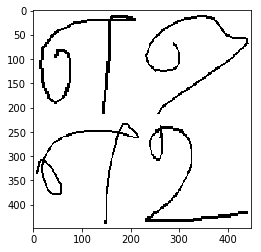

In [2]:
show_n_images = 5

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
import tensorflow as tf


tamilchars_images = helper.get_batch(glob(os.path.join(data_dir, 'tamil/*.tiff'))[:show_n_images], 224, 224, 'L')
print(tamilchars_images.size)
print(data_dir)
pyplot.imshow(helper.images_square_grid(tamilchars_images, 'L'), cmap='gray')

In [3]:
import numpy as np
np.max(tamilchars_images[0])

255.0

## Build the Neural Network
The LSGAN is built by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Input
The `model_inputs` function creates TF Placeholders for the Neural Network. It will create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

The function will return the placeholders in the tuple (tensor of real input images, tensor of z data)

In [4]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width,image_height,image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    inputs_learning_rate = tf.placeholder(tf.float32, name='input_learning_rate')

    return inputs_real, inputs_z, inputs_learning_rate


### Discriminator
The `discriminator` function is used to create a discriminator neural network that discriminates on `images`.  This function will be able to reuse the variables in the neural network. The function will return a tensor logits of the discriminator.

In [13]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: tensor logits of the discriminator
    """
    alpha=0.2
    with tf.variable_scope('discriminator',reuse=reuse):
        initializer = tf.contrib.layers.xavier_initializer_conv2d(uniform=True, seed=None,
                                                                    dtype=tf.float32)
        
        
        x1=tf.layers.conv2d(images,64,5,strides=2,padding='same', kernel_initializer=initializer)
        x1 = tf.maximum(alpha*x1,x1)
        #print('x1:',x1)
        
        x2=tf.layers.conv2d(x1,128,5,strides=2,padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x2,training=True)
        x2 = tf.maximum(alpha*x2,x2)
        #print('x2:',x2)
        
        x3=tf.layers.conv2d(x2,256,5,strides=2,padding='same', use_bias=False)
        x3 = tf.layers.batch_normalization(x3,training=True)
        x3 = tf.maximum(alpha*x3,x3)
        #print('x3:',x3)
        
        flat = tf.reshape(x3,(-1,7*7*256))
        #print('flat:',flat)
         
        logits = tf.layers.dense(flat,1)
        #print('logits:',logits)
    return logits



### Generator
The function `generator` is used to generate an image using `z`. This function will be able to reuse the variables in the neural network.  The function will return the generated 224 x 224 x `out_channel_dim` images.

In [6]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.2
    with tf.variable_scope('generator',reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*1024, use_bias=False)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 1024))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1,x1)  
        #print ('x1:',x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=1, padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2,x2)
        #print ('x2:',x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same', use_bias=False)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3,x3)
        #print ('x3:',x3)
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 5, strides=2, padding='same', use_bias=False)
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha*x4,x4)        
        #print ('x4:',x4)

        x5 = tf.layers.conv2d_transpose(x4, 64, 5, strides=2, padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x5, training=is_train)
        x5 = tf.maximum(alpha*x5,x5)
        #print ('x5:',x5)
        
        x6 = tf.layers.conv2d_transpose(x5, 32, 5, strides=2, padding='same', use_bias=False)
        x6 = tf.layers.batch_normalization(x6, training=is_train)
        x6 = tf.maximum(alpha*x6,x6)
        #print ('x6:',x6)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x6, out_channel_dim, 3, strides=2, padding='same', use_bias=False)
        #print ('logits:',logits)
        # 224x224x1 now
        
        out = tf.tanh(logits)
   

    return out


### Loss
The function `model_loss` is used to to build the LSGANs for training and calculate the loss.  The function returns a tuple of (discriminator loss, generator loss).

In [7]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
   
    g_model = generator(input_z, out_channel_dim)
    d_out_real = discriminator(input_real)
    d_out_fake = discriminator(g_model,reuse=True)
    
    d_loss = 0.5*tf.reduce_mean(tf.square(d_out_real - 1))+0.5*tf.reduce_mean(tf.square(d_out_fake))
    g_loss = 0.5*tf.reduce_mean(tf.square(d_out_fake-1))
    
    return d_loss, g_loss



### Optimization
The function `model_opt` creates the optimization operations for the GANs. It filters the variables with names that are in the discriminator and generator scope names.  The function returns a tuple of (discriminator training operation, generator training operation).

In [8]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Filter variable names that are in discriminator and generator scope names
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


## Neural Network Training
### Show Output
This function is used to show the current output of the generator during training to help determine how well the LSGANs is training.

In [9]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})
    
    g_model = samples
    g_model = np.resize(samples, (64, 224,224))
    g_model = np.stack((g_model,) * 3, axis=1)

    #inceptionscore = inception_score1.get_inception_score(g_model, 10)
    inceptionscore, stdev = inception_score.get_inception_score(g_model,10)
    print("inc",inceptionscore)
    print("stdev",stdev)
    
    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
The function `train` is used to build and train the LSGANs

In [10]:
import inception_score


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.flatten instead.


In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the LSGAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    losses = []
    steps = 0    
    print_every=50
    show_every=50
    
    #model inputs
    inputs_real, inputs_z, inputs_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    #model loss
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    #optimizer
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    d_loss_vec=[]
    g_loss_vec=[]

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images.reshape(batch_size, data_shape[1], data_shape[2], data_shape[3])
                batch_images = batch_images*2
            
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                d = sess.run(d_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, inputs_learning_rate: learning_rate})
                g = sess.run(g_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, inputs_learning_rate: learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({inputs_z: batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)   
                       
                    
    return               
                

### Tamil Dataset
This section tests the architecture on Tamil dataset.  

Epoch 2/200... Discriminator Loss: 3.9540... Generator Loss: 3.1712
Inception Score for 64 samples in 10 splits
inc 1.0006158
stdev 0.00024313746


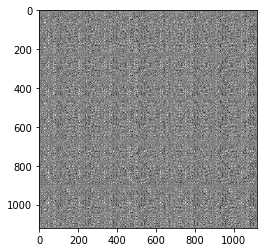

Epoch 3/200... Discriminator Loss: 3.0720... Generator Loss: 0.5851
Inception Score for 64 samples in 10 splits
inc 1.0004518
stdev 0.00019801628


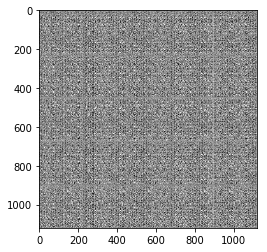

Epoch 4/200... Discriminator Loss: 0.1321... Generator Loss: 0.2506
Inception Score for 64 samples in 10 splits
inc 1.0059915
stdev 0.0024757031


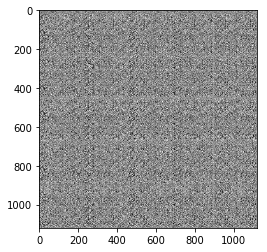

Epoch 5/200... Discriminator Loss: 0.0629... Generator Loss: 0.3133
Inception Score for 64 samples in 10 splits
inc 1.0005283
stdev 0.00022199332


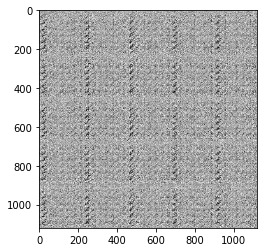

Epoch 6/200... Discriminator Loss: 0.0980... Generator Loss: 0.2596
Inception Score for 64 samples in 10 splits
inc 1.0249991
stdev 0.007986396


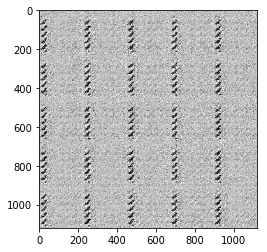

Epoch 7/200... Discriminator Loss: 0.1781... Generator Loss: 0.1128
Inception Score for 64 samples in 10 splits
inc 1.0151851
stdev 0.003646061


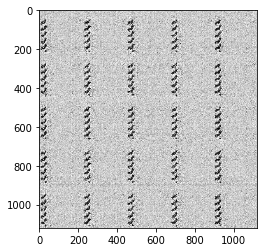

Epoch 8/200... Discriminator Loss: 0.1955... Generator Loss: 0.9639
Inception Score for 64 samples in 10 splits
inc 1.0118508
stdev 0.00846746


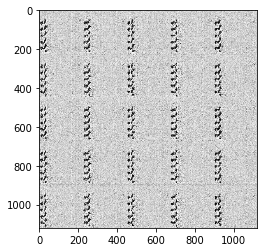

Epoch 9/200... Discriminator Loss: 0.0353... Generator Loss: 0.5653
Inception Score for 64 samples in 10 splits
inc 1.0183927
stdev 0.009804829


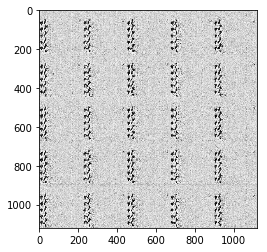

Epoch 10/200... Discriminator Loss: 0.0474... Generator Loss: 0.5713
Inception Score for 64 samples in 10 splits
inc 1.0264426
stdev 0.016115956


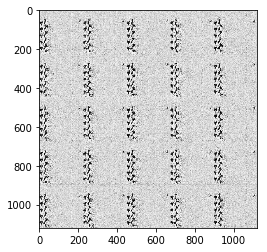

Epoch 11/200... Discriminator Loss: 0.0982... Generator Loss: 0.6735
Inception Score for 64 samples in 10 splits
inc 1.0107312
stdev 0.008229638


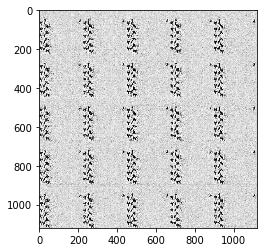

Epoch 12/200... Discriminator Loss: 0.0268... Generator Loss: 0.4092
Inception Score for 64 samples in 10 splits
inc 1.0108972
stdev 0.0069840373


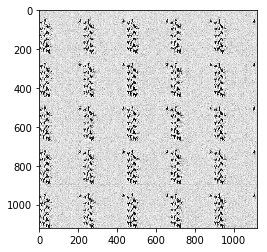

Epoch 14/200... Discriminator Loss: 0.2434... Generator Loss: 0.9623
Inception Score for 64 samples in 10 splits
inc 1.0009216
stdev 0.00057512225


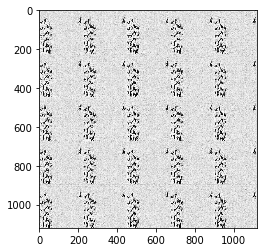

Epoch 15/200... Discriminator Loss: 0.0555... Generator Loss: 0.2596
Inception Score for 64 samples in 10 splits
inc 1.0003244
stdev 9.962e-05


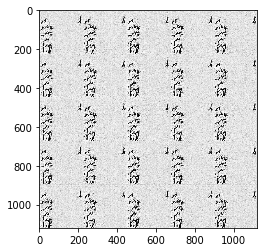

Epoch 16/200... Discriminator Loss: 0.1281... Generator Loss: 0.7301
Inception Score for 64 samples in 10 splits
inc 1.0057313
stdev 0.0034370564


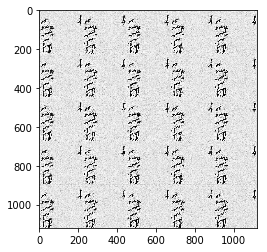

Epoch 17/200... Discriminator Loss: 0.0420... Generator Loss: 0.2956
Inception Score for 64 samples in 10 splits
inc 1.0046952
stdev 0.0011430872


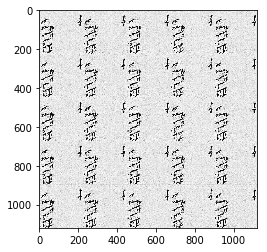

Epoch 18/200... Discriminator Loss: 0.0866... Generator Loss: 0.2057
Inception Score for 64 samples in 10 splits
inc 1.007892
stdev 0.0011900945


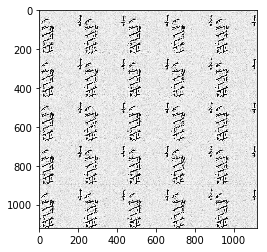

Epoch 19/200... Discriminator Loss: 0.0775... Generator Loss: 0.5545
Inception Score for 64 samples in 10 splits
inc 1.0024946
stdev 0.00047022168


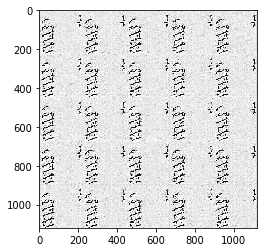

Epoch 20/200... Discriminator Loss: 0.1532... Generator Loss: 0.1234
Inception Score for 64 samples in 10 splits
inc 1.0005028
stdev 0.000107833526


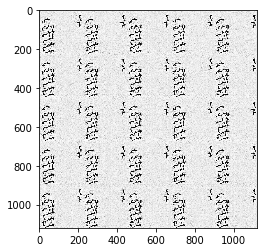

Epoch 21/200... Discriminator Loss: 0.0284... Generator Loss: 0.3458
Inception Score for 64 samples in 10 splits
inc 1.00185
stdev 0.00091862166


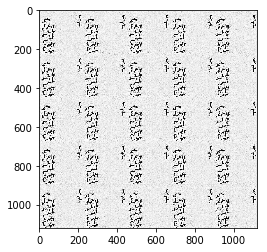

Epoch 22/200... Discriminator Loss: 0.1326... Generator Loss: 0.1556
Inception Score for 64 samples in 10 splits
inc 1.0068576
stdev 0.0033577108


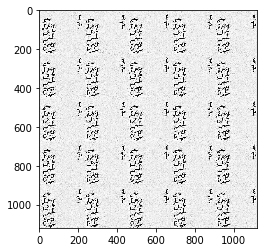

Epoch 23/200... Discriminator Loss: 0.0366... Generator Loss: 0.3133
Inception Score for 64 samples in 10 splits
inc 1.0035635
stdev 0.0003439455


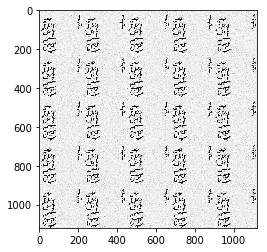

Epoch 24/200... Discriminator Loss: 0.0665... Generator Loss: 0.6080
Inception Score for 64 samples in 10 splits
inc 1.0046434
stdev 0.0011262817


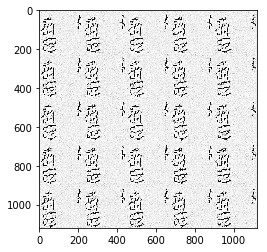

Epoch 25/200... Discriminator Loss: 0.0403... Generator Loss: 0.3083
Inception Score for 64 samples in 10 splits
inc 1.0039288
stdev 0.000819145


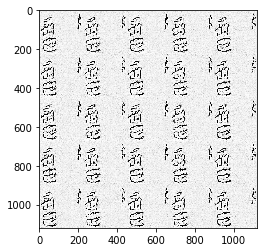

Epoch 27/200... Discriminator Loss: 0.0252... Generator Loss: 0.3715
Inception Score for 64 samples in 10 splits
inc 1.0039618
stdev 0.00092423614


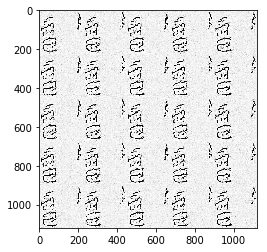

Epoch 28/200... Discriminator Loss: 0.0492... Generator Loss: 0.4460
Inception Score for 64 samples in 10 splits
inc 1.0054312
stdev 0.0019740686


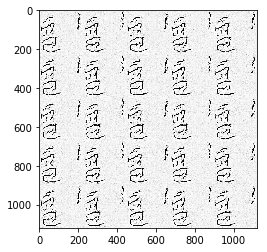

Epoch 29/200... Discriminator Loss: 0.0491... Generator Loss: 0.2751
Inception Score for 64 samples in 10 splits
inc 1.0056623
stdev 0.0010290864


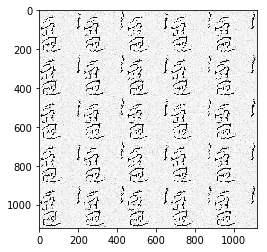

Epoch 30/200... Discriminator Loss: 0.0465... Generator Loss: 0.5474
Inception Score for 64 samples in 10 splits
inc 1.0032374
stdev 0.0009868038


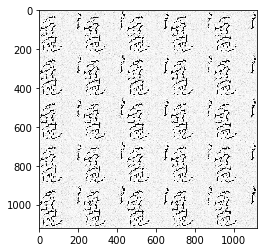

Epoch 31/200... Discriminator Loss: 0.0729... Generator Loss: 0.6695
Inception Score for 64 samples in 10 splits
inc 1.0041025
stdev 0.00082687626


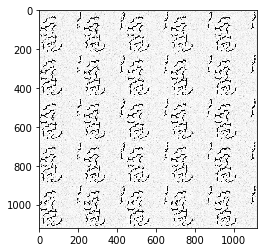

Epoch 32/200... Discriminator Loss: 0.0947... Generator Loss: 0.6885
Inception Score for 64 samples in 10 splits
inc 1.008487
stdev 0.0049618557


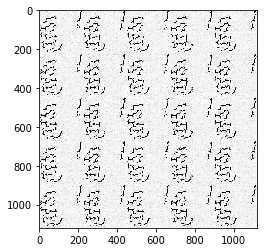

Epoch 33/200... Discriminator Loss: 0.0328... Generator Loss: 0.4847
Inception Score for 64 samples in 10 splits
inc 1.0077636
stdev 0.0026333905


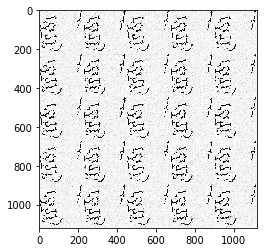

Epoch 34/200... Discriminator Loss: 0.0425... Generator Loss: 0.5542
Inception Score for 64 samples in 10 splits
inc 1.0033967
stdev 0.0020903095


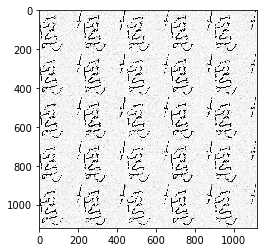

Epoch 35/200... Discriminator Loss: 0.1142... Generator Loss: 0.7692
Inception Score for 64 samples in 10 splits
inc 1.0045875
stdev 0.0016505831


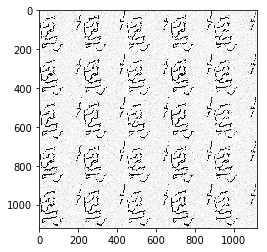

Epoch 36/200... Discriminator Loss: 0.5067... Generator Loss: 0.2696
Inception Score for 64 samples in 10 splits
inc 1.0148782
stdev 0.005235968


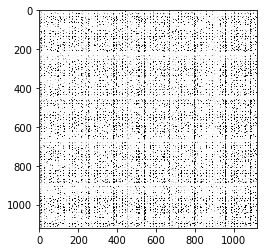

Epoch 37/200... Discriminator Loss: 0.0520... Generator Loss: 0.5493
Inception Score for 64 samples in 10 splits
inc 1.0047469
stdev 0.0019204372


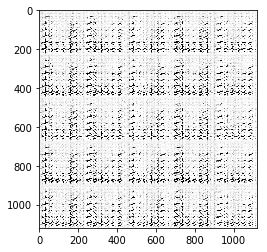

Epoch 39/200... Discriminator Loss: 0.0439... Generator Loss: 0.4655
Inception Score for 64 samples in 10 splits
inc 1.0021694
stdev 0.0005334824


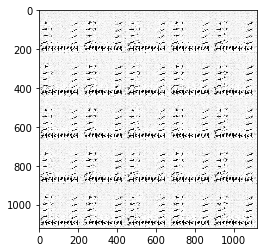

Epoch 40/200... Discriminator Loss: 0.1304... Generator Loss: 0.6703
Inception Score for 64 samples in 10 splits
inc 1.0048481
stdev 0.0016777874


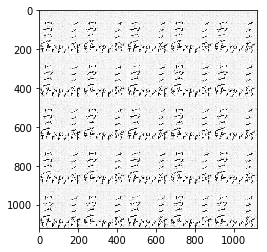

Epoch 41/200... Discriminator Loss: 0.1160... Generator Loss: 0.1597
Inception Score for 64 samples in 10 splits
inc 1.0055889
stdev 0.0015591013


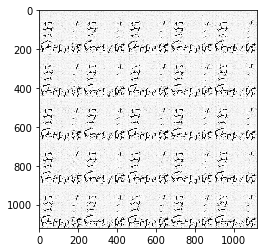

Epoch 42/200... Discriminator Loss: 0.1512... Generator Loss: 0.1228
Inception Score for 64 samples in 10 splits
inc 1.002529
stdev 0.00074684137


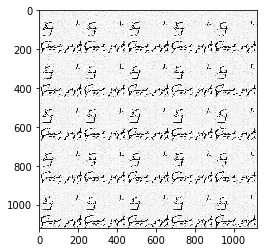

Epoch 43/200... Discriminator Loss: 0.1016... Generator Loss: 0.6812
Inception Score for 64 samples in 10 splits
inc 1.0048139
stdev 0.00072768907


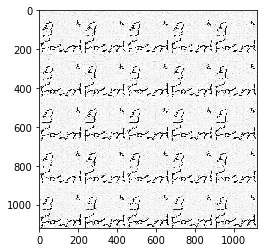

Epoch 44/200... Discriminator Loss: 0.0551... Generator Loss: 0.2774
Inception Score for 64 samples in 10 splits
inc 1.0067222
stdev 0.002618571


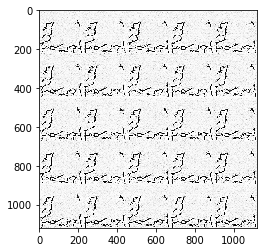

Epoch 45/200... Discriminator Loss: 0.0268... Generator Loss: 0.4163
Inception Score for 64 samples in 10 splits
inc 1.0120847
stdev 0.0046010586


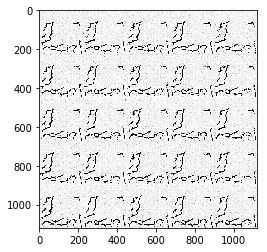

Epoch 46/200... Discriminator Loss: 0.0378... Generator Loss: 0.3232
Inception Score for 64 samples in 10 splits
inc 1.004566
stdev 0.0018155086


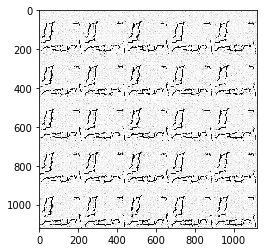

Epoch 47/200... Discriminator Loss: 0.0531... Generator Loss: 0.2967
Inception Score for 64 samples in 10 splits
inc 1.009413
stdev 0.002761292


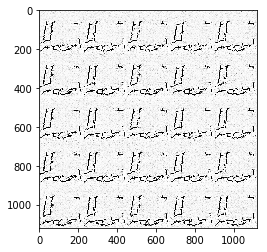

Epoch 48/200... Discriminator Loss: 0.0464... Generator Loss: 0.3879
Inception Score for 64 samples in 10 splits
inc 1.0069792
stdev 0.0010062703


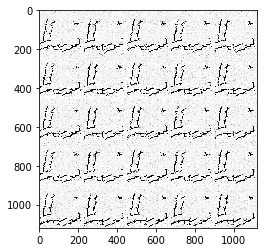

Epoch 49/200... Discriminator Loss: 0.0328... Generator Loss: 0.3700
Inception Score for 64 samples in 10 splits
inc 1.0061045
stdev 0.002498455


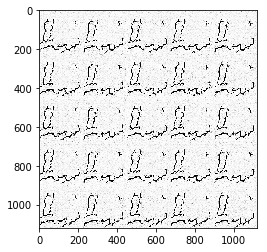

Epoch 50/200... Discriminator Loss: 0.0509... Generator Loss: 0.2776
Inception Score for 64 samples in 10 splits
inc 1.0071677
stdev 0.0016160614


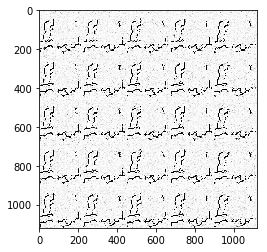

Epoch 52/200... Discriminator Loss: 0.0653... Generator Loss: 0.5482
Inception Score for 64 samples in 10 splits
inc 1.0032314
stdev 0.00067135604


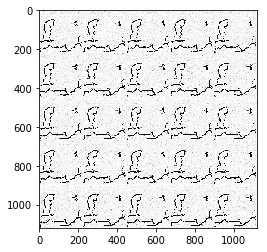

Epoch 53/200... Discriminator Loss: 0.2167... Generator Loss: 0.8742
Inception Score for 64 samples in 10 splits
inc 1.0025483
stdev 0.00083903375


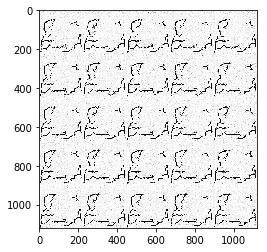

Epoch 54/200... Discriminator Loss: 0.0350... Generator Loss: 0.3499
Inception Score for 64 samples in 10 splits
inc 1.0026501
stdev 0.00067089434


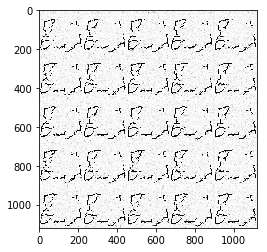

Epoch 55/200... Discriminator Loss: 0.0647... Generator Loss: 0.2525
Inception Score for 64 samples in 10 splits
inc 1.0101235
stdev 0.0029628875


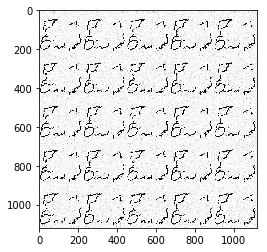

Epoch 56/200... Discriminator Loss: 0.1537... Generator Loss: 0.1416
Inception Score for 64 samples in 10 splits
inc 1.0060874
stdev 0.0015149711


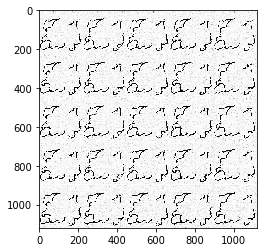

Epoch 57/200... Discriminator Loss: 0.0395... Generator Loss: 0.3111
Inception Score for 64 samples in 10 splits
inc 1.0059446
stdev 0.0017102509


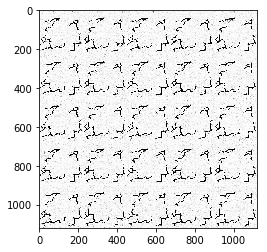

Epoch 58/200... Discriminator Loss: 0.0382... Generator Loss: 0.5620
Inception Score for 64 samples in 10 splits
inc 1.0051054
stdev 0.0014408167


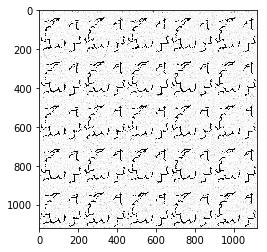

Epoch 59/200... Discriminator Loss: 0.2310... Generator Loss: 0.1281
Inception Score for 64 samples in 10 splits
inc 1.0067878
stdev 0.0010301752


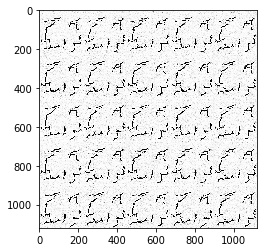

Epoch 60/200... Discriminator Loss: 0.0221... Generator Loss: 0.4193
Inception Score for 64 samples in 10 splits
inc 1.0046093
stdev 0.0016377922


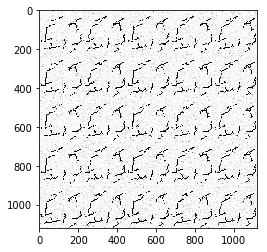

Epoch 61/200... Discriminator Loss: 0.1276... Generator Loss: 0.7050
Inception Score for 64 samples in 10 splits
inc 1.0102228
stdev 0.0039022653


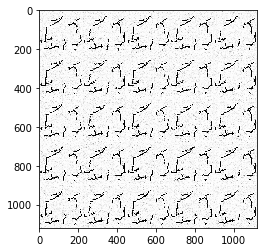

Epoch 62/200... Discriminator Loss: 0.2666... Generator Loss: 0.0852
Inception Score for 64 samples in 10 splits
inc 1.0041434
stdev 0.00062271766


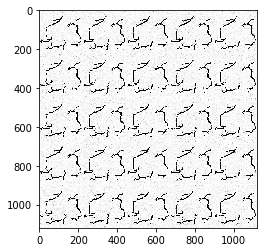

Epoch 64/200... Discriminator Loss: 0.0319... Generator Loss: 0.3499
Inception Score for 64 samples in 10 splits
inc 1.0046482
stdev 0.0012697297


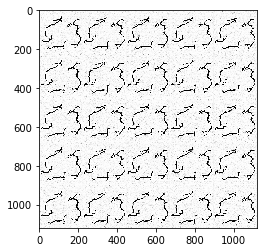

Epoch 65/200... Discriminator Loss: 0.0887... Generator Loss: 0.6853
Inception Score for 64 samples in 10 splits
inc 1.0035918
stdev 0.001071892


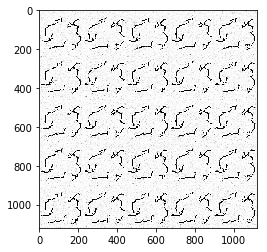

Epoch 66/200... Discriminator Loss: 0.1064... Generator Loss: 0.7264
Inception Score for 64 samples in 10 splits
inc 1.0039607
stdev 0.0010063937


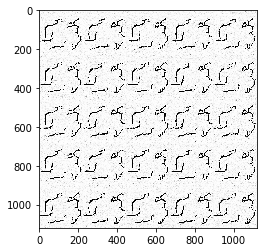

Epoch 67/200... Discriminator Loss: 0.0973... Generator Loss: 0.7467
Inception Score for 64 samples in 10 splits
inc 1.0057535
stdev 0.0029043134


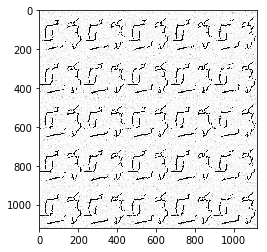

Epoch 68/200... Discriminator Loss: 0.1872... Generator Loss: 0.8418
Inception Score for 64 samples in 10 splits
inc 1.0037606
stdev 0.00075207767


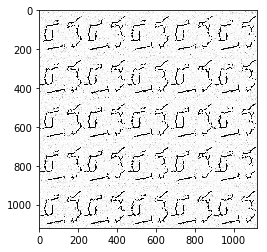

Epoch 69/200... Discriminator Loss: 0.0252... Generator Loss: 0.4198
Inception Score for 64 samples in 10 splits
inc 1.0015031
stdev 0.0004735598


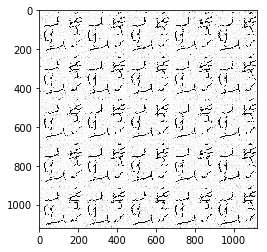

Epoch 70/200... Discriminator Loss: 0.0159... Generator Loss: 0.4221
Inception Score for 64 samples in 10 splits
inc 1.003444
stdev 0.0020538126


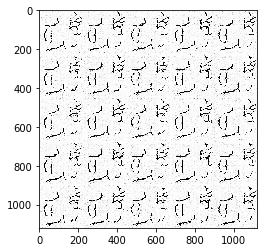

Epoch 71/200... Discriminator Loss: 0.0384... Generator Loss: 0.5317
Inception Score for 64 samples in 10 splits
inc 1.0056121
stdev 0.0021749183


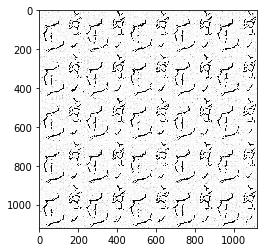

Epoch 72/200... Discriminator Loss: 0.0662... Generator Loss: 0.2481
Inception Score for 64 samples in 10 splits
inc 1.0026737
stdev 0.0011381393


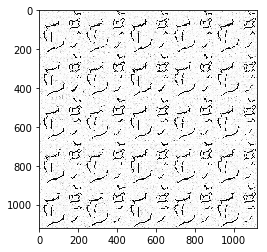

Epoch 73/200... Discriminator Loss: 0.1417... Generator Loss: 0.7795
Inception Score for 64 samples in 10 splits
inc 1.0036618
stdev 0.0010864192


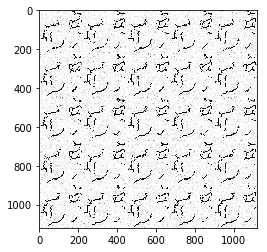

Epoch 74/200... Discriminator Loss: 0.0309... Generator Loss: 0.5575
Inception Score for 64 samples in 10 splits
inc 1.003245
stdev 0.0007738288


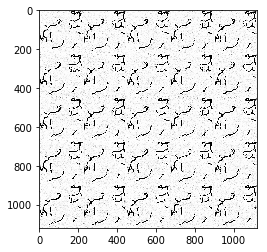

Epoch 75/200... Discriminator Loss: 0.0332... Generator Loss: 0.4083
Inception Score for 64 samples in 10 splits
inc 1.0038168
stdev 0.00076685235


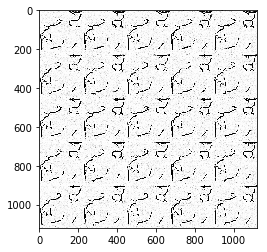

Epoch 77/200... Discriminator Loss: 0.0338... Generator Loss: 0.3471
Inception Score for 64 samples in 10 splits
inc 1.0029233
stdev 0.0011289957


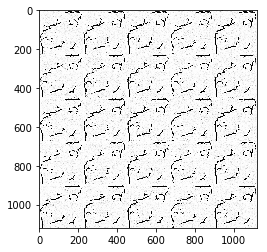

Epoch 78/200... Discriminator Loss: 0.1590... Generator Loss: 0.1485
Inception Score for 64 samples in 10 splits
inc 1.0041116
stdev 0.001380092


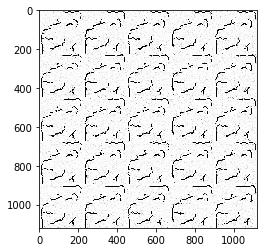

Epoch 79/200... Discriminator Loss: 0.1330... Generator Loss: 0.1696
Inception Score for 64 samples in 10 splits
inc 1.002132
stdev 0.00026232033


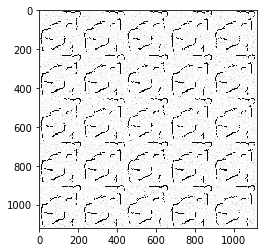

Epoch 80/200... Discriminator Loss: 0.0857... Generator Loss: 0.6353
Inception Score for 64 samples in 10 splits
inc 1.0054361
stdev 0.00086463406


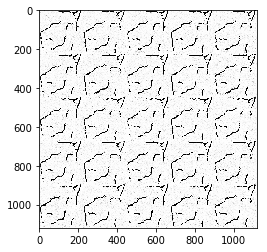

Epoch 81/200... Discriminator Loss: 0.0446... Generator Loss: 0.6025
Inception Score for 64 samples in 10 splits
inc 1.001684
stdev 0.0005767373


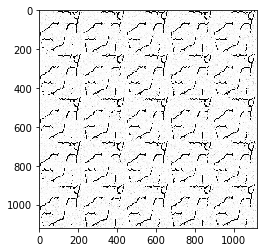

Epoch 82/200... Discriminator Loss: 0.0487... Generator Loss: 0.5584
Inception Score for 64 samples in 10 splits
inc 1.0012105
stdev 0.00033155747


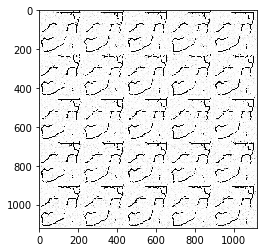

Epoch 83/200... Discriminator Loss: 0.0254... Generator Loss: 0.4581
Inception Score for 64 samples in 10 splits
inc 1.0000429
stdev 1.4505277e-05


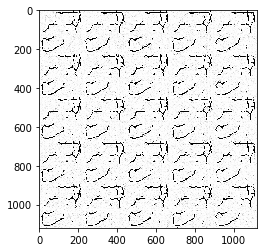

Epoch 84/200... Discriminator Loss: 0.0565... Generator Loss: 0.6186
Inception Score for 64 samples in 10 splits
inc 1.004268
stdev 0.001195939


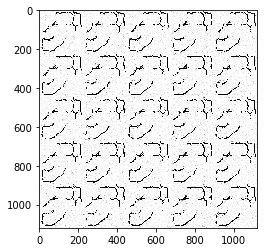

Epoch 85/200... Discriminator Loss: 0.1258... Generator Loss: 0.1706
Inception Score for 64 samples in 10 splits
inc 1.0035299
stdev 0.0008510519


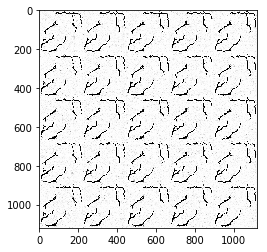

Epoch 86/200... Discriminator Loss: 0.0336... Generator Loss: 0.3503
Inception Score for 64 samples in 10 splits
inc 1.003444
stdev 0.00044837676


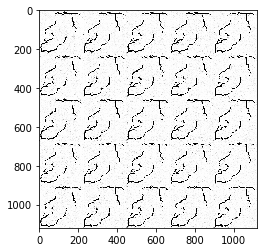

Epoch 87/200... Discriminator Loss: 0.0863... Generator Loss: 0.2242
Inception Score for 64 samples in 10 splits
inc 1.0036457
stdev 0.0013176316


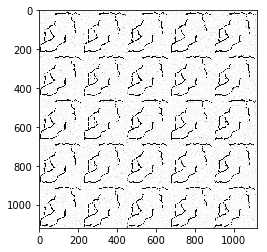

Epoch 89/200... Discriminator Loss: 0.0544... Generator Loss: 0.2898
Inception Score for 64 samples in 10 splits
inc 1.0072256
stdev 0.004313546


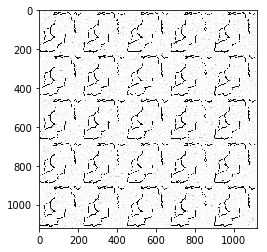

Epoch 90/200... Discriminator Loss: 0.0210... Generator Loss: 0.4458
Inception Score for 64 samples in 10 splits
inc 1.0034424
stdev 0.0012972263


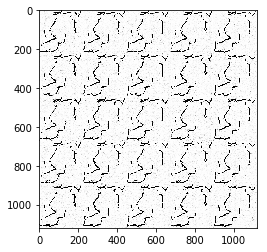

Epoch 91/200... Discriminator Loss: 0.1203... Generator Loss: 0.7355
Inception Score for 64 samples in 10 splits
inc 1.0030906
stdev 0.00040847686


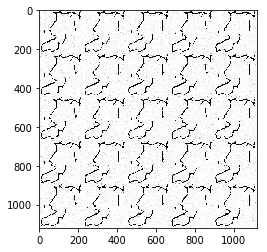

Epoch 92/200... Discriminator Loss: 0.0358... Generator Loss: 0.3593
Inception Score for 64 samples in 10 splits
inc 1.0136884
stdev 0.0074390783


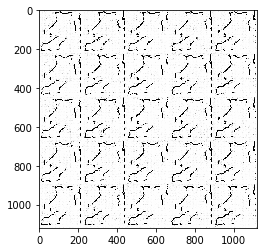

Epoch 93/200... Discriminator Loss: 0.0198... Generator Loss: 0.4601
Inception Score for 64 samples in 10 splits
inc 1.0033638
stdev 0.0009969178


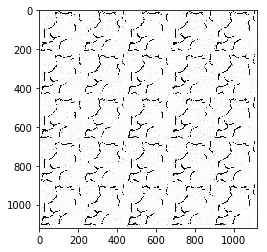

Epoch 94/200... Discriminator Loss: 0.0582... Generator Loss: 0.2681
Inception Score for 64 samples in 10 splits
inc 1.0021083
stdev 0.00082352216


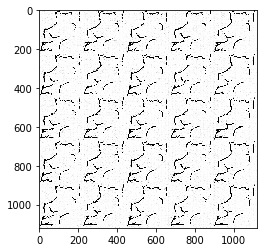

Epoch 95/200... Discriminator Loss: 0.0230... Generator Loss: 0.3873
Inception Score for 64 samples in 10 splits
inc 1.003057
stdev 0.0005743709


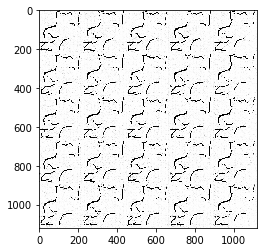

Epoch 96/200... Discriminator Loss: 0.0749... Generator Loss: 0.7024
Inception Score for 64 samples in 10 splits
inc 1.0046861
stdev 0.0019833806


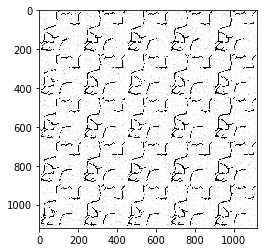

Epoch 97/200... Discriminator Loss: 0.0303... Generator Loss: 0.5412
Inception Score for 64 samples in 10 splits
inc 1.0029255
stdev 0.00053622405


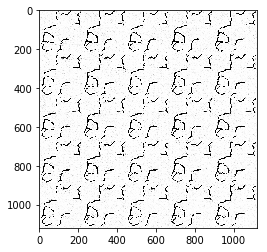

Epoch 98/200... Discriminator Loss: 0.0326... Generator Loss: 0.4676
Inception Score for 64 samples in 10 splits
inc 1.0031186
stdev 0.0004170646


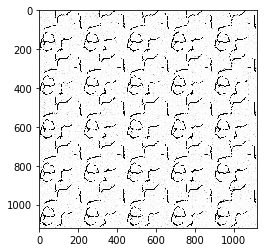

Epoch 99/200... Discriminator Loss: 0.0554... Generator Loss: 0.5938
Inception Score for 64 samples in 10 splits
inc 1.0027359
stdev 0.0003964459


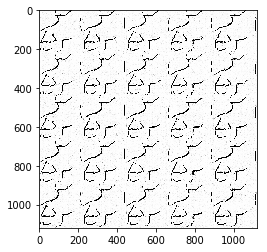

Epoch 100/200... Discriminator Loss: 0.0875... Generator Loss: 0.2108
Inception Score for 64 samples in 10 splits
inc 1.0048311
stdev 0.0010790454


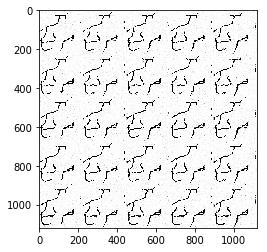

Epoch 102/200... Discriminator Loss: 0.0186... Generator Loss: 0.4025
Inception Score for 64 samples in 10 splits
inc 1.0045345
stdev 0.0017149386


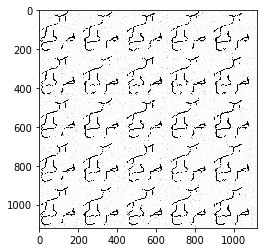

Epoch 103/200... Discriminator Loss: 0.0384... Generator Loss: 0.5798
Inception Score for 64 samples in 10 splits
inc 1.0059477
stdev 0.0025388286


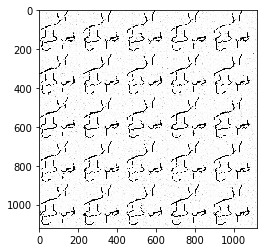

Epoch 104/200... Discriminator Loss: 0.0494... Generator Loss: 0.3404
Inception Score for 64 samples in 10 splits
inc 1.0172043
stdev 0.0054280055


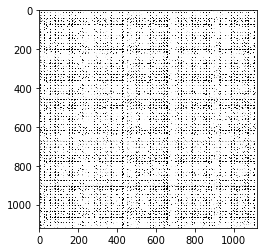

Epoch 105/200... Discriminator Loss: 0.0140... Generator Loss: 0.4966
Inception Score for 64 samples in 10 splits
inc 1.3955386
stdev 0.10168255


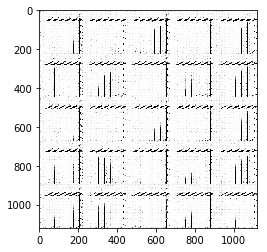

Epoch 106/200... Discriminator Loss: 0.0416... Generator Loss: 0.3175
Inception Score for 64 samples in 10 splits
inc 1.4675592
stdev 0.06728382


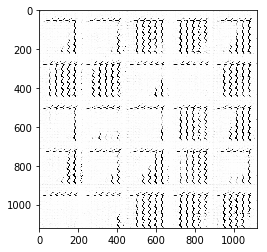

Epoch 107/200... Discriminator Loss: 0.0643... Generator Loss: 0.4702
Inception Score for 64 samples in 10 splits
inc 1.366956
stdev 0.16313517


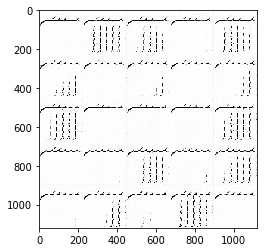

Epoch 108/200... Discriminator Loss: 0.0433... Generator Loss: 0.4099
Inception Score for 64 samples in 10 splits
inc 1.527464
stdev 0.067254946


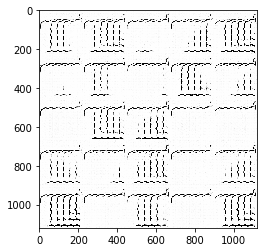

Epoch 109/200... Discriminator Loss: 0.0554... Generator Loss: 0.4201
Inception Score for 64 samples in 10 splits
inc 1.3885368
stdev 0.062256254


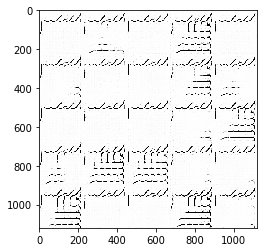

Epoch 110/200... Discriminator Loss: 0.0961... Generator Loss: 0.2085
Inception Score for 64 samples in 10 splits
inc 1.2324015
stdev 0.094765864


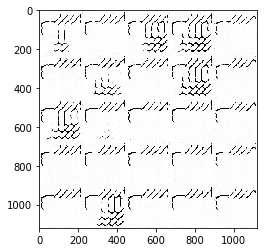

Epoch 111/200... Discriminator Loss: 0.0530... Generator Loss: 0.3397
Inception Score for 64 samples in 10 splits
inc 1.3952849
stdev 0.11730841


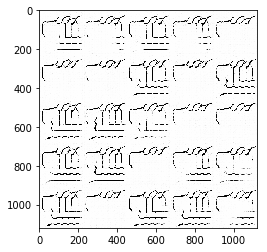

Epoch 112/200... Discriminator Loss: 0.1066... Generator Loss: 0.5710
Inception Score for 64 samples in 10 splits
inc 1.3289287
stdev 0.08297384


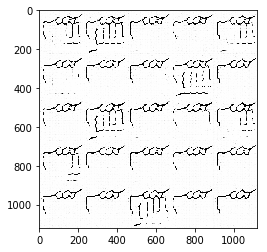

Epoch 114/200... Discriminator Loss: 0.0469... Generator Loss: 0.5200
Inception Score for 64 samples in 10 splits
inc 1.2978536
stdev 0.051393904


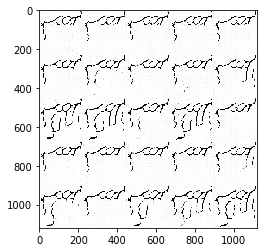

Epoch 115/200... Discriminator Loss: 0.0402... Generator Loss: 0.5570
Inception Score for 64 samples in 10 splits
inc 1.1488974
stdev 0.04042325


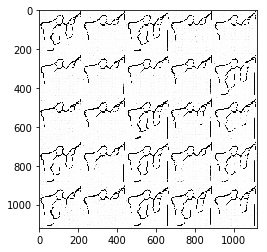

Epoch 116/200... Discriminator Loss: 0.0475... Generator Loss: 0.4754
Inception Score for 64 samples in 10 splits
inc 1.1083169
stdev 0.019953404


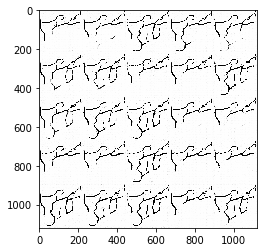

Epoch 117/200... Discriminator Loss: 0.0545... Generator Loss: 0.5745
Inception Score for 64 samples in 10 splits
inc 1.123253
stdev 0.01753789


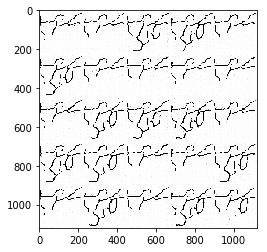

Epoch 118/200... Discriminator Loss: 0.0607... Generator Loss: 0.5645
Inception Score for 64 samples in 10 splits
inc 1.4006957
stdev 0.029391417


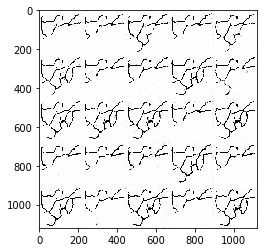

Epoch 119/200... Discriminator Loss: 0.0699... Generator Loss: 0.6516
Inception Score for 64 samples in 10 splits
inc 1.1466398
stdev 0.021155955


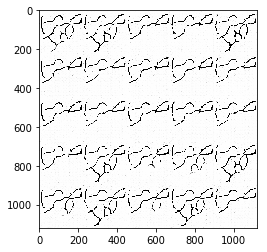

Epoch 120/200... Discriminator Loss: 0.0372... Generator Loss: 0.3208
Inception Score for 64 samples in 10 splits
inc 1.1615512
stdev 0.032827634


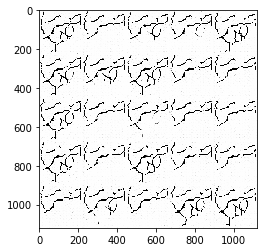

Epoch 121/200... Discriminator Loss: 0.0371... Generator Loss: 0.3287
Inception Score for 64 samples in 10 splits
inc 1.7033545
stdev 0.18560725


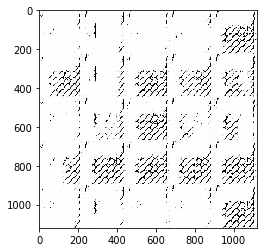

Epoch 122/200... Discriminator Loss: 0.1018... Generator Loss: 0.6423
Inception Score for 64 samples in 10 splits
inc 1.261419
stdev 0.09225852


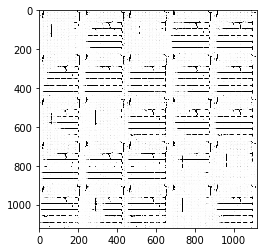

Epoch 123/200... Discriminator Loss: 0.0308... Generator Loss: 0.3613
Inception Score for 64 samples in 10 splits
inc 1.7918724
stdev 0.114413895


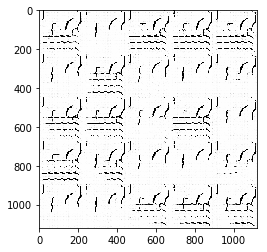

Epoch 124/200... Discriminator Loss: 0.0465... Generator Loss: 0.3595
Inception Score for 64 samples in 10 splits
inc 1.433738
stdev 0.22559378


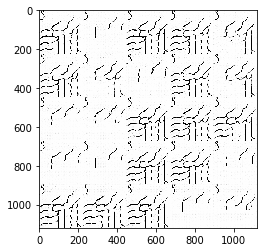

Epoch 125/200... Discriminator Loss: 0.0533... Generator Loss: 0.3870
Inception Score for 64 samples in 10 splits
inc 1.5168884
stdev 0.1279875


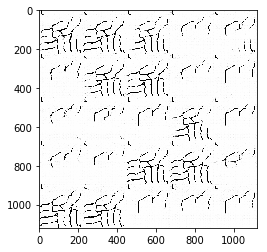

Epoch 127/200... Discriminator Loss: 0.0735... Generator Loss: 0.6001
Inception Score for 64 samples in 10 splits
inc 1.3079898
stdev 0.046917297


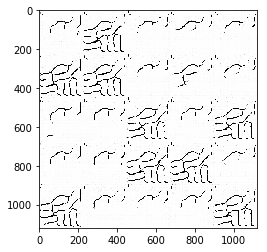

Epoch 128/200... Discriminator Loss: 0.0960... Generator Loss: 0.6460
Inception Score for 64 samples in 10 splits
inc 1.697644
stdev 0.11161867


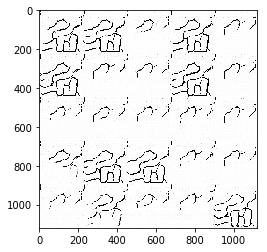

Epoch 129/200... Discriminator Loss: 0.0425... Generator Loss: 0.5149
Inception Score for 64 samples in 10 splits
inc 1.5336574
stdev 0.038647056


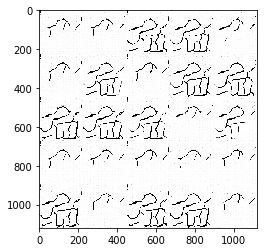

Epoch 130/200... Discriminator Loss: 0.0551... Generator Loss: 0.5754
Inception Score for 64 samples in 10 splits
inc 1.4064758
stdev 0.085867845


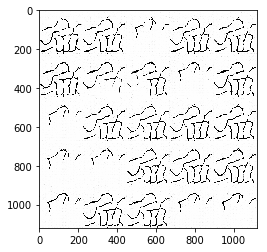

Epoch 131/200... Discriminator Loss: 0.0988... Generator Loss: 0.6933
Inception Score for 64 samples in 10 splits
inc 1.2180452
stdev 0.0649558


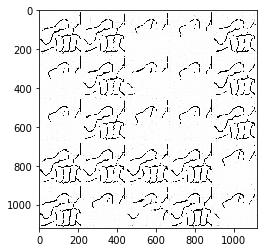

Epoch 132/200... Discriminator Loss: 0.0351... Generator Loss: 0.4762
Inception Score for 64 samples in 10 splits
inc 1.336894
stdev 0.053054832


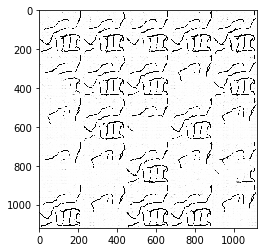

Epoch 133/200... Discriminator Loss: 0.0653... Generator Loss: 0.5867
Inception Score for 64 samples in 10 splits
inc 1.254878
stdev 0.08410632


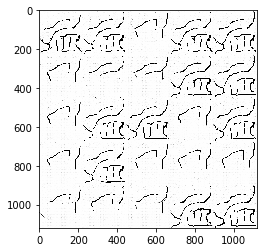

Epoch 134/200... Discriminator Loss: 0.0254... Generator Loss: 0.4469
Inception Score for 64 samples in 10 splits
inc 1.3470378
stdev 0.058903106


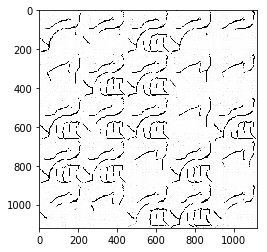

Epoch 135/200... Discriminator Loss: 0.0487... Generator Loss: 0.5611
Inception Score for 64 samples in 10 splits
inc 1.421829
stdev 0.11540038


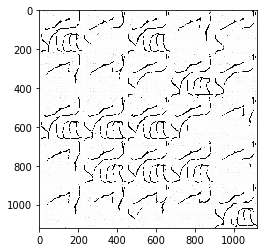

Epoch 136/200... Discriminator Loss: 0.0495... Generator Loss: 0.5418
Inception Score for 64 samples in 10 splits
inc 1.4405696
stdev 0.055131245


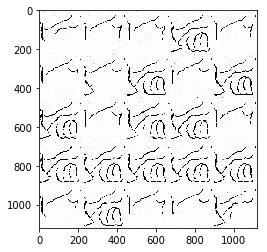

Epoch 137/200... Discriminator Loss: 0.0369... Generator Loss: 0.3491
Inception Score for 64 samples in 10 splits
inc 1.3014805
stdev 0.06390744


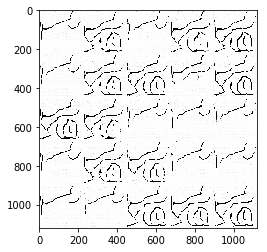

Epoch 139/200... Discriminator Loss: 0.0459... Generator Loss: 0.3070
Inception Score for 64 samples in 10 splits
inc 1.3662143
stdev 0.09113579


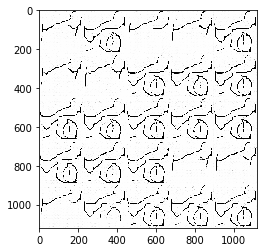

Epoch 140/200... Discriminator Loss: 0.0300... Generator Loss: 0.4569
Inception Score for 64 samples in 10 splits
inc 1.3243293
stdev 0.08101503


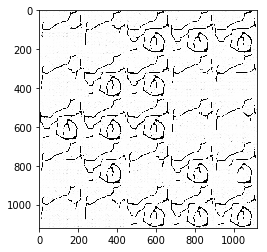

Epoch 141/200... Discriminator Loss: 0.0333... Generator Loss: 0.3867
Inception Score for 64 samples in 10 splits
inc 1.3711425
stdev 0.08168639


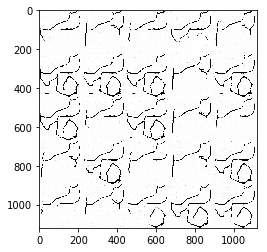

Epoch 142/200... Discriminator Loss: 0.0340... Generator Loss: 0.5374
Inception Score for 64 samples in 10 splits
inc 1.3655217
stdev 0.07689941


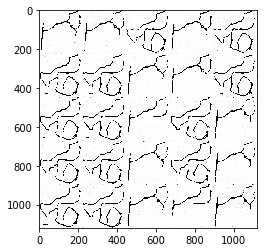

Epoch 143/200... Discriminator Loss: 0.0573... Generator Loss: 0.5112
Inception Score for 64 samples in 10 splits
inc 1.4490148
stdev 0.06544435


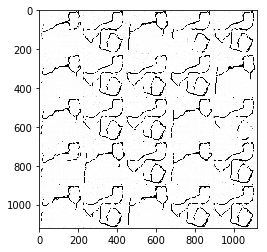

Epoch 144/200... Discriminator Loss: 0.0500... Generator Loss: 0.5401
Inception Score for 64 samples in 10 splits
inc 1.355834
stdev 0.08483962


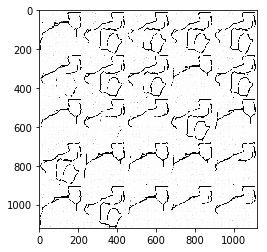

Epoch 145/200... Discriminator Loss: 0.1021... Generator Loss: 0.2093
Inception Score for 64 samples in 10 splits
inc 1.1804855
stdev 0.043608785


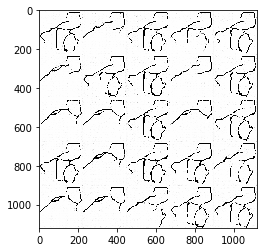

Epoch 146/200... Discriminator Loss: 0.0407... Generator Loss: 0.4014
Inception Score for 64 samples in 10 splits
inc 1.2358931
stdev 0.083168566


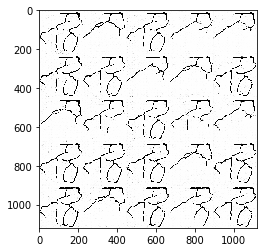

Epoch 147/200... Discriminator Loss: 0.0563... Generator Loss: 0.5944
Inception Score for 64 samples in 10 splits
inc 1.3349711
stdev 0.037483517


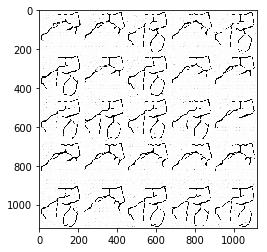

Epoch 148/200... Discriminator Loss: 0.0428... Generator Loss: 0.3239
Inception Score for 64 samples in 10 splits
inc 1.4695282
stdev 0.15474471


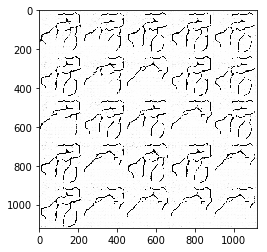

Epoch 149/200... Discriminator Loss: 0.0741... Generator Loss: 0.2451
Inception Score for 64 samples in 10 splits
inc 1.3924259
stdev 0.08066943


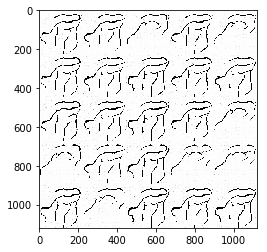

Epoch 150/200... Discriminator Loss: 0.1522... Generator Loss: 0.1655
Inception Score for 64 samples in 10 splits
inc 1.2377831
stdev 0.03273322


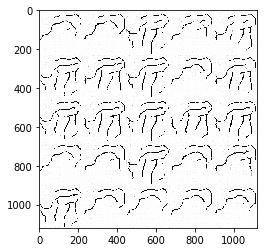

Epoch 152/200... Discriminator Loss: 0.0458... Generator Loss: 0.3318
Inception Score for 64 samples in 10 splits
inc 1.1179067
stdev 0.022308758


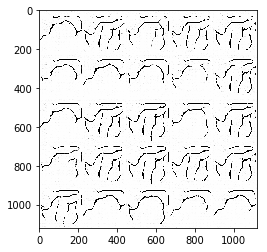

Epoch 153/200... Discriminator Loss: 0.1113... Generator Loss: 0.7084
Inception Score for 64 samples in 10 splits
inc 1.1662505
stdev 0.084545


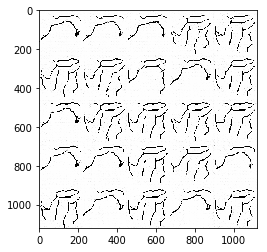

Epoch 154/200... Discriminator Loss: 0.0344... Generator Loss: 0.5157
Inception Score for 64 samples in 10 splits
inc 1.070555
stdev 0.029507907


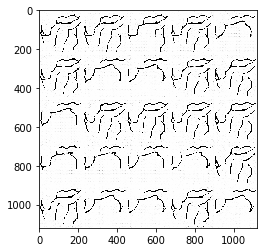

Epoch 155/200... Discriminator Loss: 0.0228... Generator Loss: 0.5192
Inception Score for 64 samples in 10 splits
inc 1.4462006
stdev 0.10627223


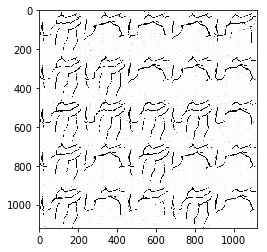

Epoch 156/200... Discriminator Loss: 0.0284... Generator Loss: 0.4626
Inception Score for 64 samples in 10 splits
inc 1.177973
stdev 0.030246394


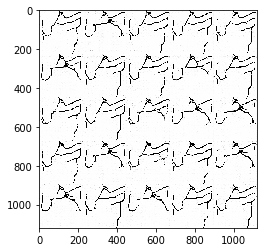

Epoch 157/200... Discriminator Loss: 0.0381... Generator Loss: 0.4948
Inception Score for 64 samples in 10 splits
inc 1.1570003
stdev 0.035876077


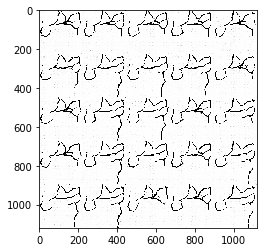

Epoch 158/200... Discriminator Loss: 0.0296... Generator Loss: 0.3743
Inception Score for 64 samples in 10 splits
inc 1.1575406
stdev 0.04140863


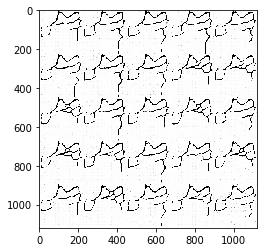

Epoch 159/200... Discriminator Loss: 0.0740... Generator Loss: 0.2487
Inception Score for 64 samples in 10 splits
inc 1.1551769
stdev 0.07492579


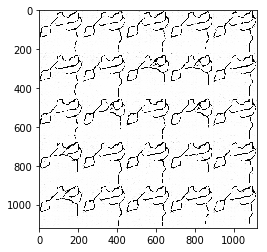

Epoch 160/200... Discriminator Loss: 0.0430... Generator Loss: 0.5468
Inception Score for 64 samples in 10 splits
inc 1.2625737
stdev 0.031534728


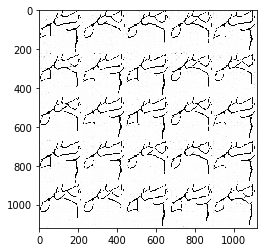

Epoch 161/200... Discriminator Loss: 0.0903... Generator Loss: 0.2117
Inception Score for 64 samples in 10 splits
inc 1.1847684
stdev 0.01721527


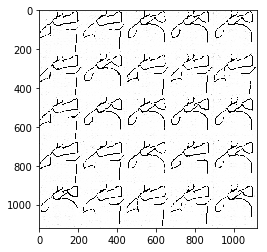

Epoch 162/200... Discriminator Loss: 0.0457... Generator Loss: 0.2987
Inception Score for 64 samples in 10 splits
inc 1.1601409
stdev 0.00753065


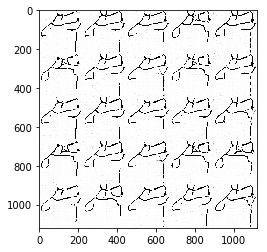

Epoch 164/200... Discriminator Loss: 0.0357... Generator Loss: 0.3369
Inception Score for 64 samples in 10 splits
inc 1.2860049
stdev 0.04551964


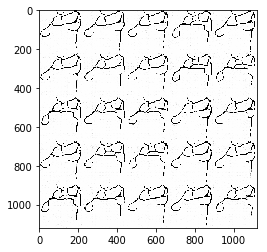

Epoch 165/200... Discriminator Loss: 0.0303... Generator Loss: 0.4675
Inception Score for 64 samples in 10 splits
inc 1.380929
stdev 0.150845


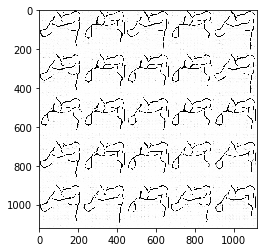

Epoch 166/200... Discriminator Loss: 0.0261... Generator Loss: 0.4791
Inception Score for 64 samples in 10 splits
inc 1.117988
stdev 0.04797185


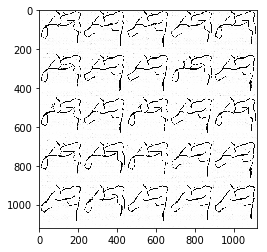

Epoch 167/200... Discriminator Loss: 0.0227... Generator Loss: 0.4749
Inception Score for 64 samples in 10 splits
inc 1.4923449
stdev 0.100090764


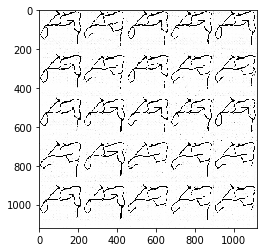

Epoch 168/200... Discriminator Loss: 0.0205... Generator Loss: 0.3884
Inception Score for 64 samples in 10 splits
inc 1.1776804
stdev 0.039838143


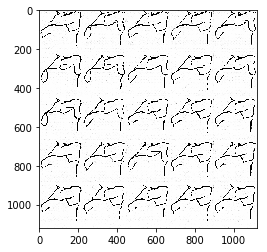

Epoch 169/200... Discriminator Loss: 0.0189... Generator Loss: 0.4323
Inception Score for 64 samples in 10 splits
inc 1.0951004
stdev 0.021777954


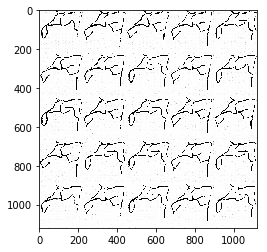

Epoch 170/200... Discriminator Loss: 0.0523... Generator Loss: 0.6018
Inception Score for 64 samples in 10 splits
inc 1.2557554
stdev 0.06102958


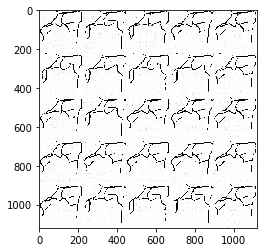

Epoch 171/200... Discriminator Loss: 0.0990... Generator Loss: 0.2040
Inception Score for 64 samples in 10 splits
inc 1.1800624
stdev 0.045966066


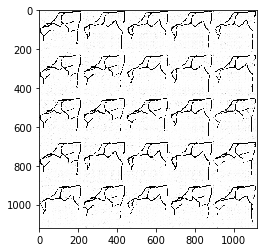

Epoch 172/200... Discriminator Loss: 0.0191... Generator Loss: 0.4470
Inception Score for 64 samples in 10 splits
inc 1.2121772
stdev 0.043784156


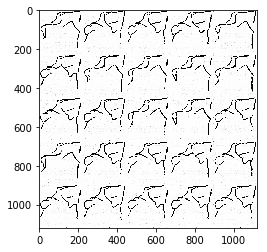

Epoch 173/200... Discriminator Loss: 0.0215... Generator Loss: 0.4117
Inception Score for 64 samples in 10 splits
inc 1.0762842
stdev 0.0208822


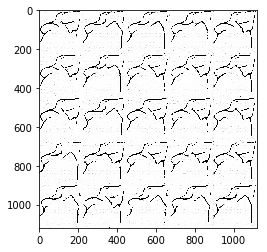

Epoch 174/200... Discriminator Loss: 0.1110... Generator Loss: 0.1908
Inception Score for 64 samples in 10 splits
inc 1.255797
stdev 0.054899547


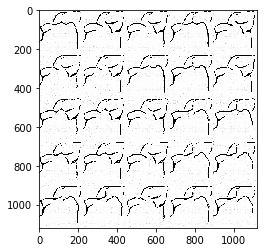

Epoch 175/200... Discriminator Loss: 0.0223... Generator Loss: 0.4124
Inception Score for 64 samples in 10 splits
inc 1.2054787
stdev 0.01418043


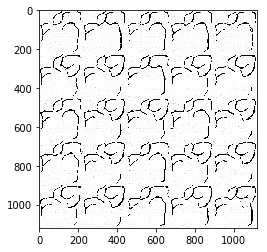

Epoch 177/200... Discriminator Loss: 0.5927... Generator Loss: 0.1468
Inception Score for 64 samples in 10 splits
inc 1.4883335
stdev 0.07483761


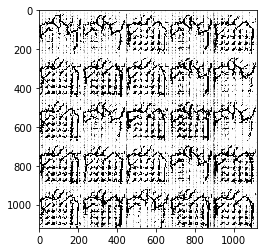

Epoch 178/200... Discriminator Loss: 0.1126... Generator Loss: 0.5003
Inception Score for 64 samples in 10 splits
inc 1.2848082
stdev 0.12345599


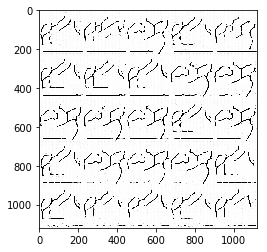

Epoch 179/200... Discriminator Loss: 0.0571... Generator Loss: 0.2745
Inception Score for 64 samples in 10 splits
inc 1.3744063
stdev 0.09317971


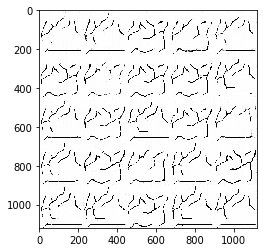

Epoch 180/200... Discriminator Loss: 0.0729... Generator Loss: 0.5999
Inception Score for 64 samples in 10 splits
inc 1.5720263
stdev 0.09072908


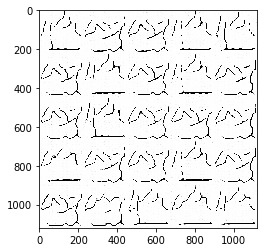

Epoch 181/200... Discriminator Loss: 0.0403... Generator Loss: 0.4507
Inception Score for 64 samples in 10 splits
inc 1.2982885
stdev 0.056532115


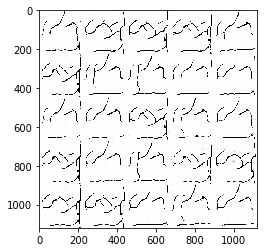

Epoch 182/200... Discriminator Loss: 0.0431... Generator Loss: 0.4444
Inception Score for 64 samples in 10 splits
inc 1.3948675
stdev 0.054899782


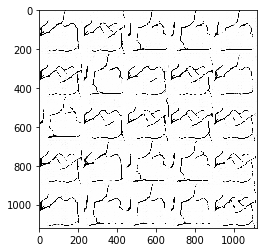

Epoch 183/200... Discriminator Loss: 0.0910... Generator Loss: 0.2169
Inception Score for 64 samples in 10 splits
inc 1.3060935
stdev 0.07073076


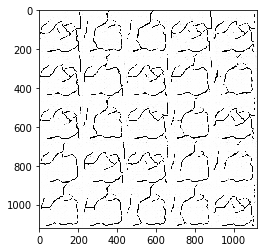

Epoch 184/200... Discriminator Loss: 0.0478... Generator Loss: 0.4981
Inception Score for 64 samples in 10 splits
inc 1.2804525
stdev 0.09994504


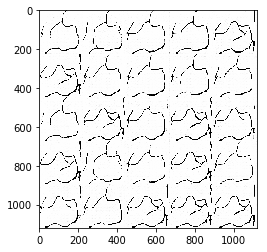

Epoch 185/200... Discriminator Loss: 0.0820... Generator Loss: 0.4019
Inception Score for 64 samples in 10 splits
inc 1.1026175
stdev 0.06824311


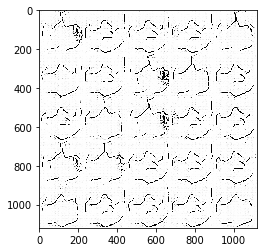

Epoch 186/200... Discriminator Loss: 0.1615... Generator Loss: 0.1257
Inception Score for 64 samples in 10 splits
inc 1.2342887
stdev 0.1063902


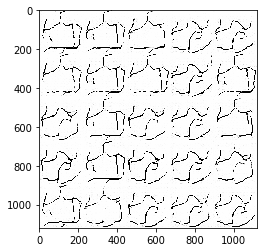

Epoch 187/200... Discriminator Loss: 0.0516... Generator Loss: 0.3164
Inception Score for 64 samples in 10 splits
inc 1.2395153
stdev 0.030347232


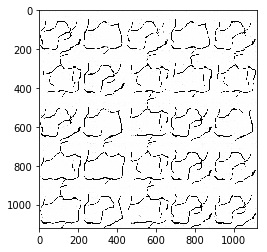

Epoch 189/200... Discriminator Loss: 0.0416... Generator Loss: 0.3546
Inception Score for 64 samples in 10 splits
inc 1.4113982
stdev 0.06075196


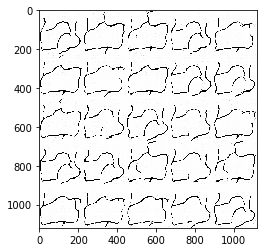

Epoch 190/200... Discriminator Loss: 0.0349... Generator Loss: 0.3819
Inception Score for 64 samples in 10 splits
inc 1.5447044
stdev 0.051423218


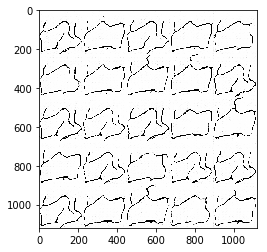

Epoch 191/200... Discriminator Loss: 0.0572... Generator Loss: 0.5273
Inception Score for 64 samples in 10 splits
inc 1.4290631
stdev 0.074267976


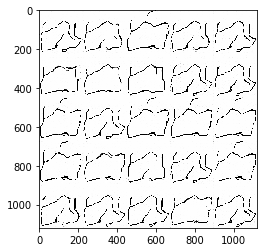

Epoch 192/200... Discriminator Loss: 0.0436... Generator Loss: 0.4891
Inception Score for 64 samples in 10 splits
inc 1.2219512
stdev 0.018562842


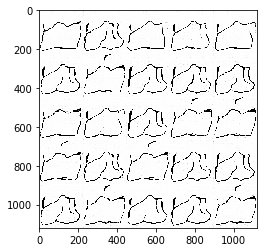

Epoch 193/200... Discriminator Loss: 0.0333... Generator Loss: 0.3740
Inception Score for 64 samples in 10 splits
inc 1.3999664
stdev 0.070484735


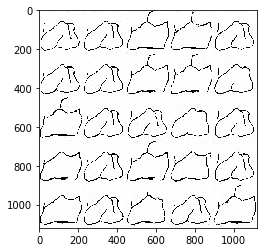

Epoch 194/200... Discriminator Loss: 0.1009... Generator Loss: 0.2009
Inception Score for 64 samples in 10 splits
inc 1.5180349
stdev 0.12531075


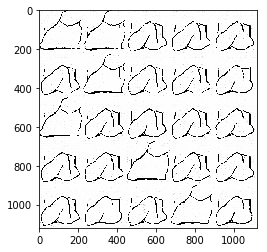

Epoch 195/200... Discriminator Loss: 0.0313... Generator Loss: 0.3998
Inception Score for 64 samples in 10 splits
inc 1.4156457
stdev 0.07872882


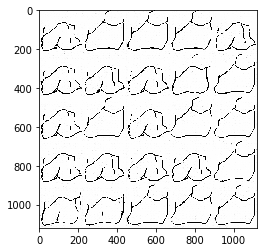

Epoch 196/200... Discriminator Loss: 0.0901... Generator Loss: 0.2214
Inception Score for 64 samples in 10 splits
inc 1.3505723
stdev 0.067094244


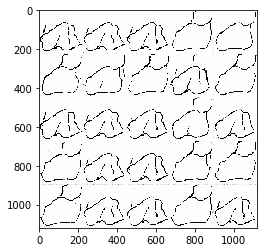

Epoch 197/200... Discriminator Loss: 0.0363... Generator Loss: 0.3960
Inception Score for 64 samples in 10 splits
inc 1.444799
stdev 0.07237345


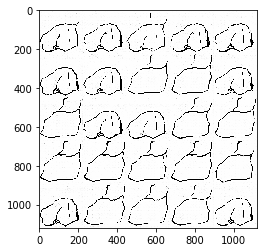

Epoch 198/200... Discriminator Loss: 0.0850... Generator Loss: 0.2711
Inception Score for 64 samples in 10 splits
inc 1.4189137
stdev 0.066623226


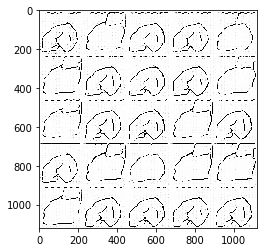

Epoch 199/200... Discriminator Loss: 0.0756... Generator Loss: 0.4303
Inception Score for 64 samples in 10 splits
inc 1.4396026
stdev 0.072314985


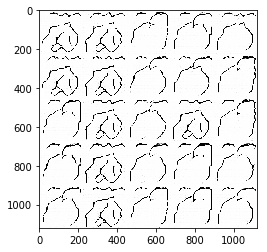

Epoch 200/200... Discriminator Loss: 0.0845... Generator Loss: 0.3750
Inception Score for 64 samples in 10 splits
inc 1.356987
stdev 0.15475863


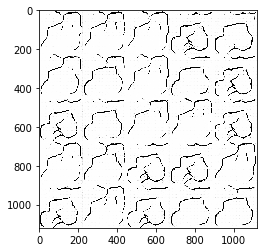

In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.00025
beta1 = 0.5

epochs = 200

tamil_dataset = helper.Dataset('tamil', glob(os.path.join(data_dir, 'tamil/*.tiff')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, tamil_dataset.get_batches,
          tamil_dataset.shape, tamil_dataset.image_mode)

#### Summary
Implemented DCGAN with more convolution layers on Tamil dataset and was able to train the DCGAN